# Reducción de ruido

In [1]:
import numpy as np
from scipy.io.wavfile import read, write
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = [30,15]
plt.rcParams.update({'font.size' : 18})

In [2]:
rate, audio = read("Test.wav")
segundos = audio.shape[0]/rate
audio = audio[ : int(audio.shape[0]/60 * 2)]

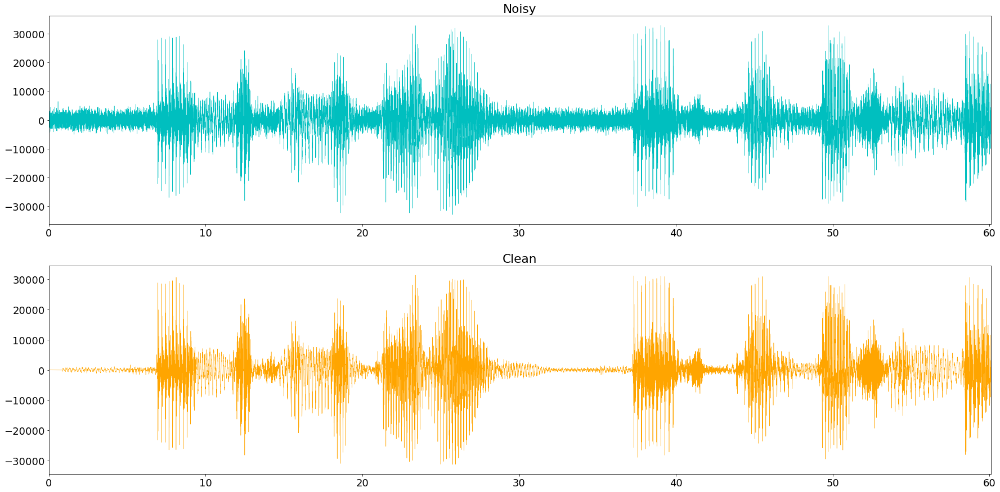

In [3]:
t = np.linspace(0, segundos, audio.shape[0])
dt = t[1]-t[0]
f = audio
f_clean = f
f = f + 1500*np.random.randn(len(t)) #le agregamos ruido aleatorio.

fig, axs = plt.subplots(2,1)

plt.sca(axs[0])
plt.plot(t, f, color = 'c', linewidth = 0.5)
plt.xlim(t[0], t[-1])
plt.title("Noisy")

plt.sca(axs[1])
plt.plot(t, f_clean, color = 'orange', linewidth = 0.5)
plt.xlim(t[0], t[-1])
plt.title("Clean")

plt.show() #Graficamos los sonidos

In [4]:
write("Test_noisy.wav", rate, f.astype(np.int16))

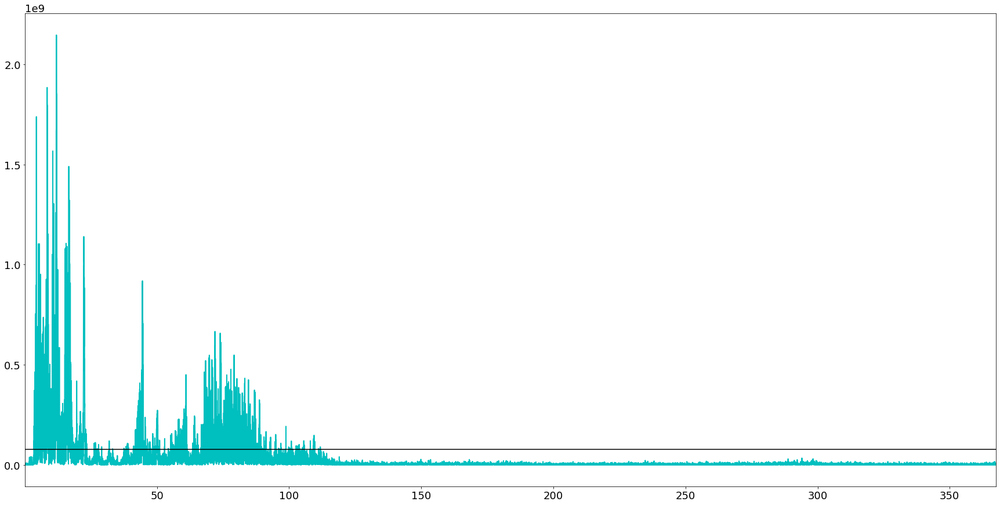

In [5]:
n = len(t)
delta = 50000000

fhat = np.fft.fft(f, n) #Transformamos el sonido
PSD = fhat * np.conj(fhat) / n #Calculamos la densidad espectral.
PSD = np.real(PSD) #Con la parte real nos basta.
freq = (1 / (dt*n)) * np.arange(n)
L = np.arange(1, np.floor(n/2), dtype = 'int')

tol = np.mean(PSD[L]) #Definomos una tolerancia. Se puede modificar esto para testear con distintos valores.

fig, axs = plt.subplots(1,1)


plt.sca(axs)
plt.plot(freq[L], PSD[L], color = 'c', linewidth = 2, label = 'Noisy')
plt.xlim(freq[L[0]], freq[L[-1]])
plt.plot([0, freq[L[-1]]], [tol+delta, tol+delta], color = 'black')


plt.show() #Graficamos la densidad espectral v/s la frecuencia.

In [6]:
indices =(PSD > tol+delta) #Filtramos
PSD_clean = PSD * indices
fhat = indices * fhat
ffilt = np.real(np.fft.ifft(fhat)) #Devolvemos la transformación.

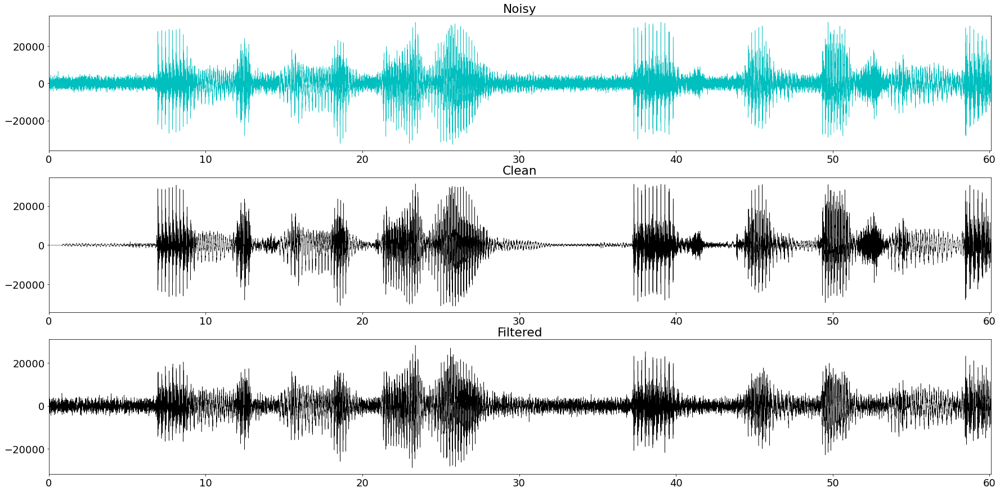

In [7]:
fig, axs = plt.subplots(3, 1)

plt.sca(axs[0])
plt.plot(t, f, color = 'c', linewidth = 0.5)
plt.xlim(t[0], t[-1])
plt.title("Noisy")

plt.sca(axs[1])
plt.plot(t, f_clean, color = 'k', linewidth = 0.5)
plt.xlim(t[0], t[-1])
plt.title("Clean")

plt.sca(axs[2])
plt.plot(t, ffilt, color = 'k', linewidth = 0.5)
plt.xlim(t[0], t[-1])
plt.title("Filtered")

plt.show()

In [8]:
write("Test_filtered.wav", rate, ffilt.astype(np.int16))

In [9]:
from IPython.display import Audio

In [10]:
Audio("Test.wav")

In [11]:
Audio("Test_noisy.wav")

In [12]:
Audio("Test_filtered.wav")

Como vemos, se ha filtrado relativamente bien el ruido. El ruido que persiste termmina siendo de las frecuencias que coincide con las frecuencias de la voz.

# Resolición de una EDP

Se presentará una forma de usar FFT para resolver una EDP. En particular veremos la resolución de la ecuación:

\begin{equation}
u_t = \alpha^2 u_{xx}
\end{equation}


Donde u es una función que modela la temperatura en función del tiempo y el espacio, en este caso, unidimensional.

In [13]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import odeint
import plotly.express as px
import pandas as pd
import matplotlib.cm as cm
plt.rcParams['figure.figsize'] = [12, 12]
plt.rcParams.update({'font.size' : 18})

MAXTIME = 1000 #Modifique esto para ver más adelante en el tiempo

In [14]:
a = 1
L = 100
N = 1000
dx = L/N
x = np.arange(-L/2, L/2, dx) #Definimos el dominio donde vamos a trabajar.

In [15]:
kappa = 2*np.pi*np.fft.fftfreq(N, d = dx) #Definimos el vector de k mencionado en el documento

In [16]:
u0 = np.zeros_like(x)
u0[int( (L/2 - L/10)/dx-150) : int( (L/2 + L/10)/dx-150)] = 1
u0[int( (L/2 - L/10)/dx+150) : int( (L/2 + L/10)/dx+150)] = 1 #Asignamos las temperaturas iniciales.
u0hat = np.fft.fft(u0) #Calculamos la transformada de este vector de datos iniciales.

In [17]:
u0hat_ri = np.concatenate( (u0hat.real, u0hat.imag)) #La librería que usamos para integrar no es óptima al trabajar con números complejos
                                                     #Así que concatenamos el vector transformado, pero considerando todo como real.

In [18]:
dt = 0.1
t = np.arange(0, MAXTIME, dt) #Instanciamos el dominio temporal

In [19]:
def rhsHeat(uhat_ri, t, kappa, a):
    uhat = uhat_ri[: N] + (1j) * uhat_ri[N:] 
    d_uhat = -a**2 * (np.power(kappa, 2)) * uhat
    d_uhat_ri = np.concatenate((d_uhat.real, d_uhat.imag)).astype('float64') #Calculamos lo que se menciona en el documento, -alpha^2 k^2 F(u)
    return d_uhat_ri

In [20]:
uhat_ri = odeint(rhsHeat, u0hat_ri, t, args = (kappa, a)) #Resolvemos las EDOs

In [21]:
uhat = uhat_ri[: , :N] + (1j) * uhat_ri[: , N: ]

In [22]:
u = np.zeros_like(uhat)

In [23]:
for k in range(len(t)):
    u[k, :] = np.fft.ifft(uhat[k, : ]) #Devolvemos la transformación para así obtener u

In [24]:
u = u.real

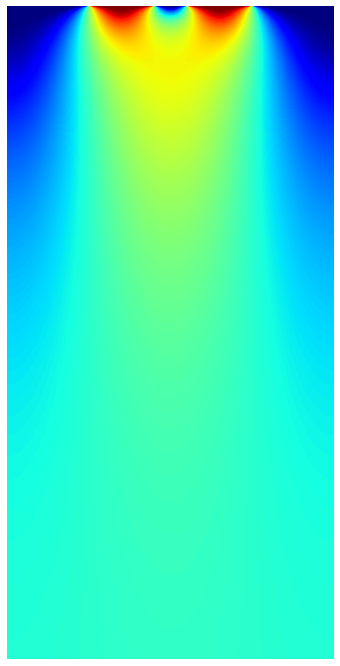

In [25]:
fig = plt.figure()
u_plot = u[0 : -1 : 5, :]

for j in range( u_plot.shape[0]):
    ys = j*np.ones(u_plot.shape[1])
    
plt.imshow(-u, aspect = 0.2)
plt.axis('off')
plt.set_cmap('jet_r')
plt.show() #Grafiamos un mapa de color, donde el color corresponde a la temperatura y el avance hacia abajo es en el tiempo.

In [26]:
step = 50 #Esto lo puede modificar para considerar los pasos intermedios
x_ = []
y = []
z = []
time = []
for j in range( 0, u_plot.shape[0], step):
    x_ += x.tolist()
    time += (j*np.ones_like(x)).astype('float64').tolist()
    y += (j*np.ones(u_plot.shape[1])).tolist()
    z += (u_plot[j, : ]).tolist()

df = {"x" : x_, 'y' : y, 'z' : z, 'time' : time}
df = pd.DataFrame(df)
fig = px.line_3d(df, x = 'x', y = 'y', z = 'z',
                 labels = dict(x = 'Space', y = 'Time', z = 'Temperature'),
                 color = 'time',
                 color_discrete_sequence=['#6A76FC'])
fig.show() #Hacemos una gráfica interactiva para poder ver cómo se modifica en el tiempo la temperatura.